In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import quandl
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style('whitegrid')

In [2]:
import plotly
import plotly.plotly as py
import plotly.offline as pyo
from plotly.graph_objs import *
import pandas as pd
pyo.offline.init_notebook_mode()

In [3]:
import warnings; warnings.simplefilter('ignore')
import plotly
import cufflinks as cf
cf.go_offline()
cf.set_config_file(world_readable=True,offline=False)

In [4]:
m_30 = quandl.get("FMAC/FIX30YR", authtoken="xxxxxxxxxxxxx") #USE Quandl API Key to generate data or use .csv file below             

In [5]:
m = pd.read_csv('30_years_mortgage_rate.csv')
m.head(1)

,Week,US Interest Rate,Fees & Points,Regional Rates: NE,Regional Rates: SE,Regional Rates: NC,Regional Rates: SW,Regional Rates: W,Regional Fees/Points: NE,Regional Fees/Points: SE,Regional Fees/Points: NC,Regional Fees/Points: SW,Regional Fees/Points: W
0,1971-04-02,7.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
mortgage_rate = m.filter(['Week','US Interest Rate'], axis=1)

In [7]:
mortgage_rate.head()

,Week,US Interest Rate
0,1971-04-02,7.33
1,1971-04-09,7.31
2,1971-04-16,7.31
3,1971-04-23,7.31
4,1971-04-30,7.29


In [8]:
house = pd.read_csv('FMAC-HPI.csv', index_col= 0,parse_dates= ['Date'], low_memory=False)

In [9]:
house.head(1)

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,TX,UT,VA,VT,WA,WI,WV,WY,United States not seasonaly adjusted,United States seasonaly adjusted
Date,,,,,,,,,,,,,,,,,,,,,
2017-03-31,174.034916,133.764762,139.295694,176.28768,212.730124,180.762827,130.710581,350.896283,150.098765,196.774747,...,184.953381,175.956615,180.59936,166.068804,203.964097,134.62475,143.729524,185.378279,170.711142,171.204726


In [10]:
mortgage_rate.describe()

,US Interest Rate
count,2417.000000
mean,8.199783
std,3.163143
min,3.310000
25%,6.040000
50%,7.740000
75%,9.840000
max,18.630000


In [11]:
mortgage_rate = mortgage_rate.reset_index()

In [12]:
mortgage_rate['Week'] = pd.to_datetime(mortgage_rate['Week'], errors = 'coerce')

In [13]:
mortgage_rate = mortgage_rate.set_index('Week')

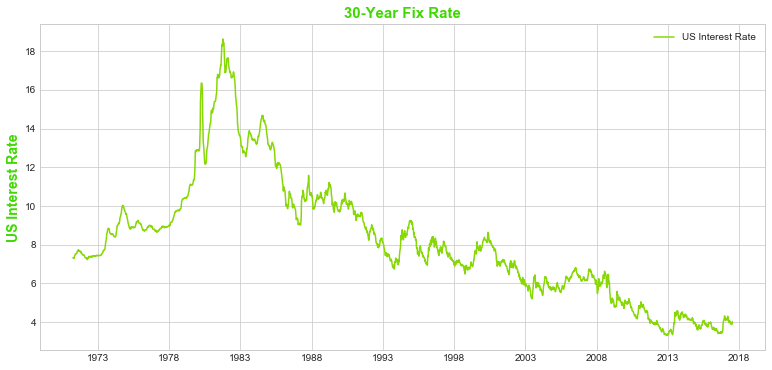

In [14]:
plt.figure(figsize = (13,6))
plt.plot(mortgage_rate['US Interest Rate'], color = '#87d804')
plt.title('30-Year Fix Rate', weight = 'bold', size = 15, color = '#40d803')
plt.ylabel('US Interest Rate', weight = 'bold', size = 14, color = '#40d803')
plt.legend(loc = 'best');

In [15]:
mortgage_rate['Interest Rate percentage_change'] = mortgage_rate['US Interest Rate'].pct_change()

In [16]:
mortgage_rate.drop('index', axis = 1, inplace = True)

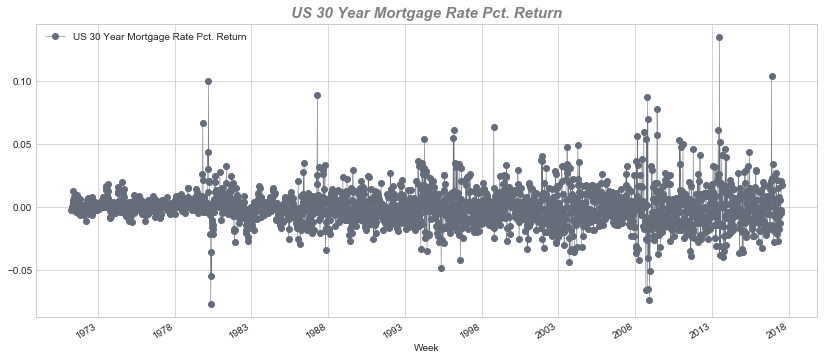

In [17]:
mortgage_rate['Interest Rate percentage_change'].plot(figsize = (14,6),color = '#656d7a', marker = 'o', lw = 0.5,
                                                      label = 'US 30 Year Mortgage Rate Pct. Return')
plt.legend()
plt.title('US 30 Year Mortgage Rate Pct. Return', color = 'grey', weight = 'bold',style = 'italic', size = 15)
plt.show()

In [18]:
mortgage_rate.head(1)

,US Interest Rate,Interest Rate percentage_change
Week,,
1971-04-02,7.33,NaN


In [19]:
mortgage_rate.iplot(filename='fin_time_series_1', world_readable=True)

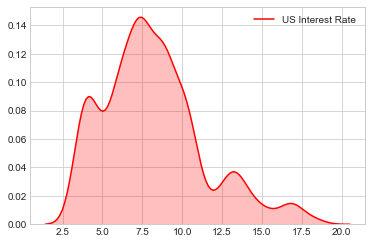

In [20]:
sns.kdeplot(mortgage_rate['US Interest Rate'].dropna(),shade = True, color = 'red')

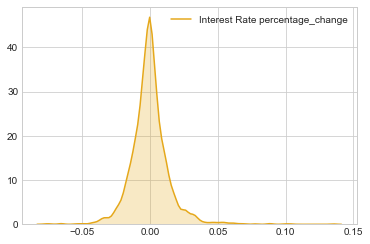

In [21]:
sns.kdeplot(mortgage_rate['Interest Rate percentage_change'].dropna(),shade = True, color = '#e5a81b')

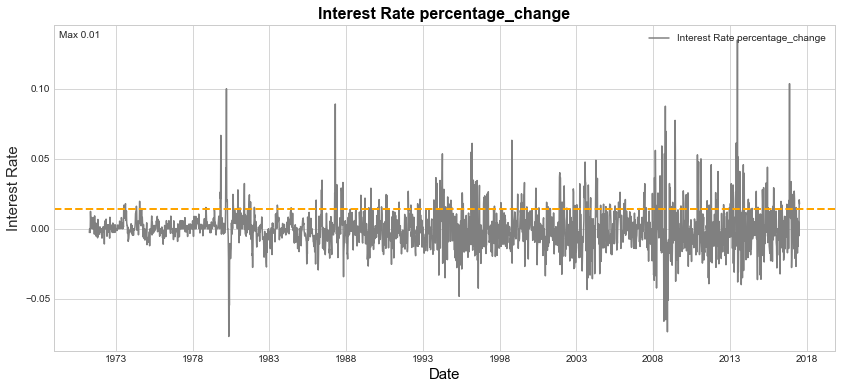

In [24]:
plt.figure(figsize = (14,6))
plt.plot(mortgage_rate['Interest Rate percentage_change'], color = 'grey', ls = '-', label = "Interest Rate percentage_change")
plt.title("Interest Rate percentage_change", weight = 'bold', size = 16, color = 'k')
plt.xlabel('Date', size = 15, color = 'k')
plt.ylabel('Interest Rate', size = 15)
plt.legend(loc = 1)

symbol_mean = mortgage_rate['Interest Rate percentage_change'].std()

plt.figtext(0.13, 0.85, "Max %0.2f" % symbol_mean)

plt.axhline(y = symbol_mean, linewidth = 2, color = 'orange',ls = '--' );

In [25]:
ticker = ['AZ','CO','DE','TX']

state_index = pd.concat([house['AZ'],house['CO'],house['DE'],house['TX']],axis=1, keys = ticker)

state_index.columns.names = ['State']


In [26]:
states = pd.DataFrame(state_index)
type(states)

pandas.core.frame.DataFrame

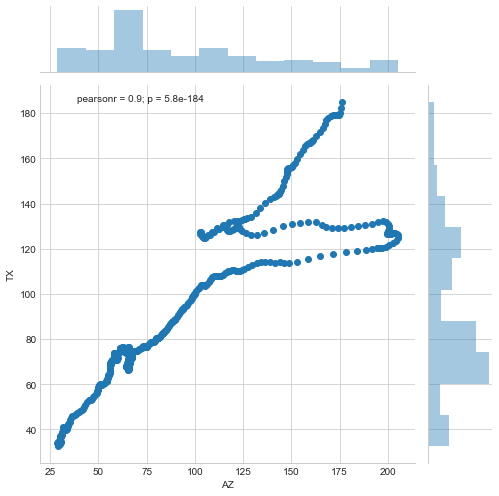

In [28]:
sns.jointplot(x = 'AZ', y = 'TX', data = house, size = 7);

In [29]:
house[['AZ','TX']].iplot(filename='fin_time_series_4', bestfit=True, world_readable=True,color = ['blue','orange'])

In [30]:
house[['MI','IL','OH']].iplot(filename='fin_time_series_4', bestfit=True, world_readable=True,color = ['red','blue','brown'])

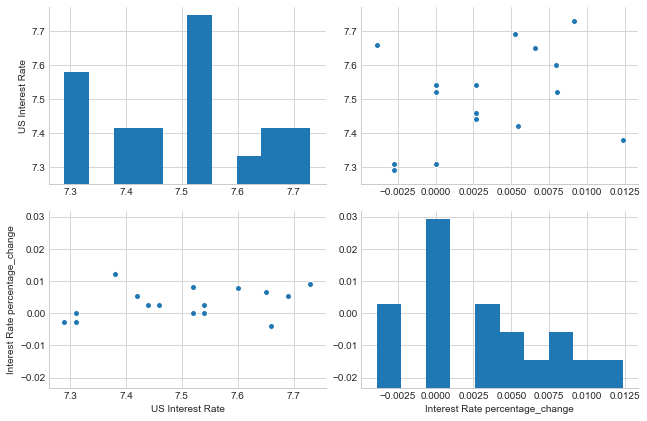

In [31]:
sns.pairplot(mortgage_rate[1:20],size=3, aspect=1.5)

In [32]:
SnotA = {'type':'scatter',
              'mode':'lines',
              'name':'constructor',
              'x': house.index,
              'y':house['United States not seasonaly adjusted']}

data = Data([SnotA])

layout = {'title':'United States not seasonaly adjusted',
         'xaxis':{'title':'Year'},
         'yaxis':{'title':'Index Value'}}

fig = Figure(data = data, layout =layout)
pyo.iplot(fig)

In [33]:
house.columns

Index(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY', 'United States not seasonaly adjusted',
       'United States seasonaly adjusted'],
      dtype='object')

In [34]:
house['MI'].describe()

count    507.000000
mean      69.832595
std       27.868222
min       24.424905
25%       40.302510
50%       72.000276
75%       94.895780
max      115.735764
Name: MI, dtype: float64

In [35]:
house['Michigan_Return'] = house['MI'].pct_change().shift(-1)

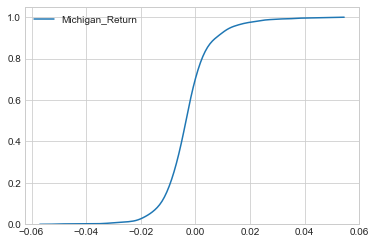

In [37]:
sns.kdeplot(house['Michigan_Return'].dropna(), cumulative = True);

In [38]:
trace = {'type':'scatter',
        'mode': 'markers',
        'x': house['NY'],
        'y': house['CA']}

layout = {'title': 'Scatter Plot New York versus California',
         'xaxis': {'title': 'New York'},
         'yaxis': {'title': 'California'},
         'hovermode': 'closest'}

fig = Figure(data = [trace], layout = layout)
pyo.iplot(fig)

In [39]:
house[['TN','SD','MA','RI']].iplot(filename='fin_time_series_4',bestfit = True,
                                 world_readable=True,color = ['red','blue','brown','orange'])

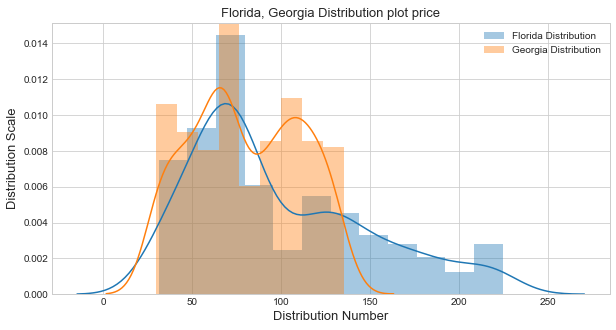

In [40]:
plt.figure(figsize = (10,5))
sns.distplot(house['FL'],label  = 'Florida Distribution')
sns.distplot(house['GA'], label = 'Georgia Distribution')
plt.title('Florida, Georgia Distribution plot price', size = 13)
plt.xlabel('Distribution Number', size = 13)
plt.ylabel('Distribution Scale', size = 13)
plt.legend(loc = 'best')
plt.show()

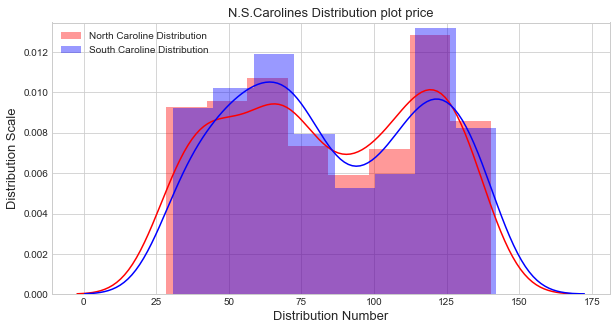

In [41]:
plt.figure(figsize = (10,5))
sns.distplot(house['NC'],label  = 'North Caroline Distribution', color = 'red')
sns.distplot(house['SC'], label = 'South Caroline Distribution', color = 'blue')
plt.title('N.S.Carolines Distribution plot price', size = 13)
plt.xlabel('Distribution Number', size = 13)
plt.ylabel('Distribution Scale', size = 13)
plt.legend(loc = 'best');

In [42]:
house.columns

Index(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY', 'United States not seasonaly adjusted',
       'United States seasonaly adjusted', 'Michigan_Return'],
      dtype='object')

In [43]:
X = house[['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY']]

In [44]:
y = house['United States seasonaly adjusted']

In [46]:
from sklearn.cross_validation import train_test_split
from sklearn.linear_model import LinearRegression

In [47]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.4, random_state=10)

In [48]:
lm = LinearRegression()

In [49]:
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [50]:
lm.intercept_

-3.8535655044210557

In [51]:
lm.coef_

array([ 0.00055788,  0.09552767,  0.17812569,  0.13481574,  0.35996474,
       -0.01351154, -0.1967737 ,  0.11639106,  0.05232563,  0.07799524,
        0.04989296,  0.03283845,  0.00693271,  0.09323253,  0.4416036 ,
        0.03695285,  0.0432469 ,  0.28247678,  0.15508142,  0.02609538,
       -0.29242718, -0.02947306, -0.08703571,  0.05009946,  0.10431178,
       -0.04783089,  0.11547077,  0.45816525, -0.06563708,  0.04391185,
       -0.18776194,  0.12611431,  0.1022926 , -0.07343549,  0.07467534,
       -0.21158772, -0.01198986, -0.27106712, -0.33052525,  0.24523561,
       -0.14813363,  0.0586788 ,  0.21173501, -0.18703641, -0.14226649,
       -0.23998636,  0.10419114,  0.01749131, -0.29061542,  0.00245338,
       -0.03321668])

In [52]:
X_train.columns

Index(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY'],
      dtype='object')

In [53]:
cdf = pd.DataFrame(lm.coef_ , X.columns, columns = ['Coeff'])
cdf.T

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Coeff,0.000558,0.095528,0.178126,0.134816,0.359965,-0.013512,-0.196774,0.116391,0.052326,0.077995,...,0.058679,0.211735,-0.187036,-0.142266,-0.239986,0.104191,0.017491,-0.290615,0.002453,-0.033217


In [54]:
predict = lm.predict(X_test)
print(predict)

[ 70.91652357 101.13766134 120.73196067  61.26008588 140.69046617
  43.28142454 127.87166123 165.10223614  74.19583505  82.15960402
 147.11379003  84.20000427 107.65845739  73.07768328  72.8648847
  74.76733187  69.96071925 106.15573847 113.30883389 136.10665032
 131.8712832   40.39499165 161.09687522  70.11460341 101.8854599
  66.15287541 165.29539296  34.99397202  72.16090259  44.95648637
  98.98924692  81.47226964  62.08913286 140.04123053  29.48706302
  24.74048824  42.08326819  72.08512221  70.42311583 131.74492676
  81.09738887  83.9055107   47.70350521 100.51261882 134.12581031
  63.32652547  57.4670798   28.3389965   72.39349085 151.42111741
 124.07318621  48.40128923  80.39896379 135.33143452  23.68247331
  75.35015579 164.14670799  58.48795809  70.32245112  53.34488815
 164.727078   163.01168945 125.42727332  75.39430783 114.38737934
 158.66555214 125.34888034  50.88983021 106.31721011  75.49125239
  40.15580124  72.03193365  26.67941861  54.13299583 137.98967039
  87.9721279

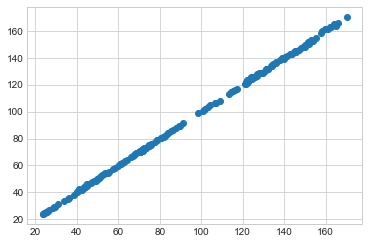

In [56]:
plt.scatter(y_test, predict);

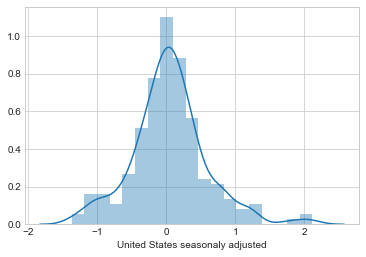

In [58]:
sns.distplot((y_test - predict));

In [59]:
from sklearn import metrics

In [60]:
metrics.mean_absolute_error(y_test, predict)

0.39421688694414575

In [61]:
metrics.mean_squared_error(y_test, predict)

0.299354407042555

In [62]:
np.sqrt(metrics.mean_squared_error(y_test, predict))

0.5471328970575202